In [1]:
# Deep Convolutional GANs work on multichannel : color images with RGB values for pixels

import os, time
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tqdm import tqdm
from tensorflow.keras import layers
from tensorflow.keras.layers import Add, Dense, ReLU, Reshape, LeakyReLU

In [2]:
os.getcwd()

'/content'

In [3]:
#!unzip -q '/content/images.zip' -d /content/

In [4]:
!ls /content

images	images.zip  sample_data


In [5]:
batch_size=32  # 128
train_dataset =tf.keras.preprocessing.image_dataset_from_directory(
    '/content/images', label_mode=None, image_size=(64,64), batch_size=batch_size)

# unlabled (unsuprvised)
# load images in the form of dataset object
# load my training data in batches when run the training process
# color image: 3 values (RGB values of the pixel) used to represent every pixel in each img - each RGB is an integer between 0-255 -> range -1 to 1

train_dataset=train_dataset.map(lambda x:(x/127.5)-1)

Found 6724 files belonging to 1 classes.


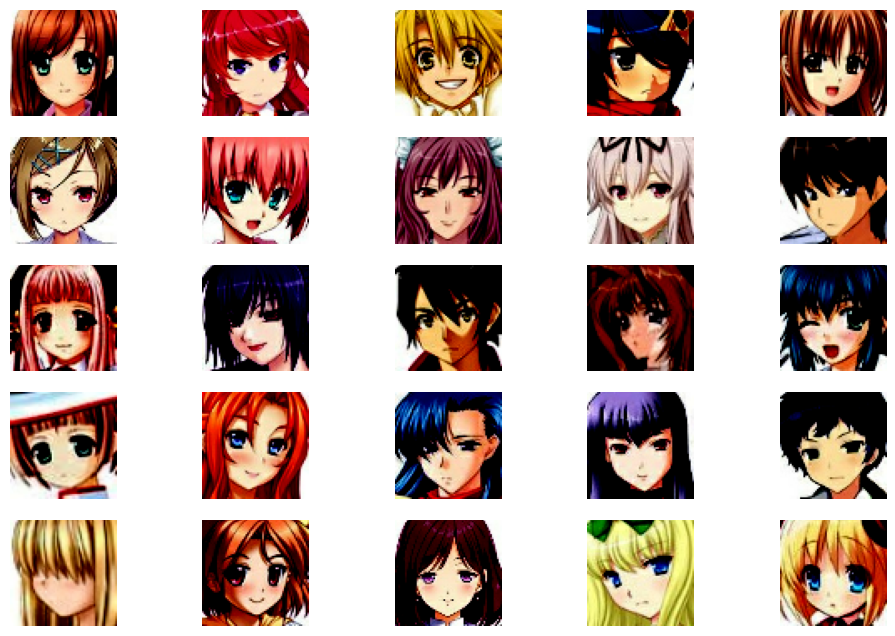

In [6]:
plt.figure(figsize=(12,8))
for images in train_dataset.take(1):
  for i in range(25): # extract 1st 25 images from the 1st batch in the training dataset
    ax=plt.subplot(5,5,i+1)
    plt.imshow(images[i].numpy())
    plt.axis('off')

# each img is 64*64 multichannel

Image_shape (64, 64, 3)


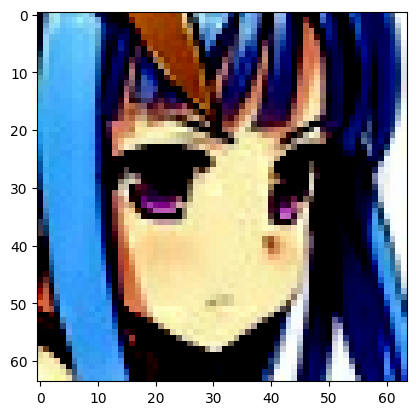

In [7]:
for batch in train_dataset:
  plt.imshow(batch[0])
  print('Image_shape',batch[0].shape)
  break

In [8]:
init_weights_kernel=tf.keras.initializers.RandomNormal(mean=0.0,stddev=0.02)
# random normal kernel to initialize the weights of the layers of my model - a Gaussian kernel with the mean and std dev

In [9]:
def generator_model():
  model=tf.keras.Sequential()

  model.add(layers.Input(shape=(100,)))   # noise vector
  model.add(layers.Dense(4*4*256))        # 4d
  model.add(layers.BatchNormalization())
  model.add(layers.ReLU())
  model.add(layers.Reshape((4,4,256)))

  model.add(layers.Conv2DTranspose(128,kernel_size=4,strides=2,padding='same',kernel_initializer=init_weights_kernel,
                                   use_bias=False))
  model.add(layers.BatchNormalization())
  model.add(layers.ReLU())

  model.add(layers.Conv2DTranspose(64,kernel_size=4,strides=2,padding='same',kernel_initializer=init_weights_kernel,
                                   use_bias=False))
  model.add(layers.BatchNormalization())
  model.add(layers.ReLU())

  model.add(layers.Conv2DTranspose(32,kernel_size=4,strides=2,padding='same',kernel_initializer=init_weights_kernel,
                                   use_bias=False))
  model.add(layers.BatchNormalization())
  model.add(layers.ReLU())

  model.add(layers.Conv2DTranspose(3, kernel_size=4,strides=2,padding='same', activation='tanh',
                                   kernel_initializer=init_weights_kernel, use_bias=False))  # 3 channel
# tanh: -1 to 1
  return model


In [10]:
generator = generator_model()
generator.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 4096)              413696    
                                                                 
 batch_normalization (Batch  (None, 4096)              16384     
 Normalization)                                                  
                                                                 
 re_lu (ReLU)                (None, 4096)              0         
                                                                 
 reshape (Reshape)           (None, 4, 4, 256)         0         
                                                                 
 conv2d_transpose (Conv2DTr  (None, 8, 8, 128)         524288    
 anspose)                                                        
                                                                 
 batch_normalization_1 (Bat  (None, 8, 8, 128)         5

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


In [11]:
noise=tf.random.normal([1,100])  # generate Gaussian noise: vector size is 100= input dimension of our generator model
generated_image=generator(noise,training=False)  # False: see the generated img looks like
generated_image.shape

TensorShape([1, 64, 64, 3])

In [12]:
generated_image[0,:5,:5]

<tf.Tensor: shape=(5, 5, 3), dtype=float32, numpy=
array([[[ 6.03767767e-05, -2.18790345e-04, -1.50245933e-05],
        [-2.57144202e-05,  1.20631128e-04, -7.06229039e-05],
        [ 6.87962165e-06, -9.69418252e-05,  4.02652222e-06],
        [-9.99468248e-05,  1.09043423e-04,  2.15447981e-05],
        [ 2.22602146e-04,  1.38100484e-04,  8.86483904e-05]],

       [[-3.62618302e-04,  1.38518997e-04,  6.65526255e-04],
        [ 4.56102571e-04,  6.59778016e-06,  5.15440421e-04],
        [-3.37243342e-04, -7.77897876e-05,  3.45208973e-04],
        [ 6.39865466e-04,  5.58290165e-04, -3.86951317e-04],
        [-5.21883194e-04, -6.81031524e-05, -1.99446309e-04]],

       [[ 4.48015962e-05, -3.93308175e-04, -3.84889310e-04],
        [-4.04108927e-04, -6.15527824e-06, -6.37757301e-04],
        [-7.07803294e-04,  1.26032042e-04, -4.05975472e-04],
        [-1.30586399e-04,  5.82681096e-04, -1.41731158e-04],
        [-3.38172133e-04, -2.58342316e-05, -5.90783078e-04]],

       [[-2.21750903e-04, -1

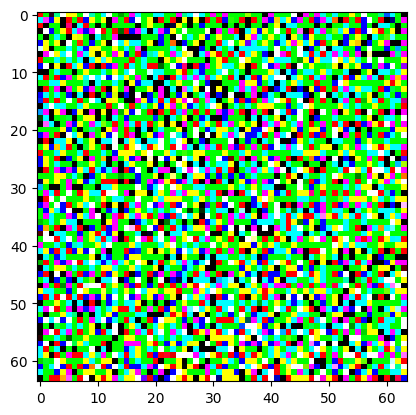

In [13]:
plt.imshow(generated_image[0,:,:,:]*255*100)
# noise - color - 60 pixels *60 pixels

In [14]:
def discriminator_model():
    model = tf.keras.Sequential()
    model.add(layers.Conv2D(32,kernel_size=3,strides=2,padding='same',input_shape=[64,64,3],
                            kernel_initializer=init_weights_kernel, use_bias=False))
    model.add(layers.LeakyReLU(alpha=0.2)) # slight gradient for input values below zero: controlled by the input argument (o.2) that we pass into LR
    model.add(layers.Dropout(0.3)) # dropout: overfitting : turning off a % of neurons in the layer

    model.add(layers.Conv2D(64,kernel_size=3,strides=2,padding='same',input_shape=[64,64,3],
                            kernel_initializer=init_weights_kernel, use_bias=False))
    model.add(layers.ZeroPadding2D(padding=((0,1),(0,1)))) # slight gradient for input values below zero: controlled by the input argument (o.2) that we pass into LR
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(0.2)) # slight gradient for input values below zero: controlled by the input argument (0.2) that we pass into LR
    model.add(layers.Dropout(0.25)) # dropout: overfitting : turning off a % of neurons in the layer

    model.add(layers.Conv2D(128,kernel_size=3,strides=2,padding='same',input_shape=[64,64,3],
                            kernel_initializer=init_weights_kernel, use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(256,kernel_size=3,strides=2,padding='same',input_shape=[64,64,3],
                            kernel_initializer=init_weights_kernel, use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    model.add(layers.Flatten())
    model.add(layers.Dense(1, activation='sigmoid')) # single probability score: represent the prob that input img is real - sigmoid : prob score : 0-1

    return model


In [15]:
discriminator=discriminator_model()
discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 32, 32, 32)        864       
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 32, 32, 32)        0         
                                                                 
 dropout (Dropout)           (None, 32, 32, 32)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 16, 16, 64)        18432     
                                                                 
 zero_padding2d (ZeroPaddin  (None, 17, 17, 64)        0         
 g2D)                                                            
                                                                 
 batch_normalization_4 (Bat  (None, 17, 17, 64)        256       
 chNormalization)                                     

In [16]:
discriminator=discriminator_model()
output=discriminator(generated_image)
print(output)


tf.Tensor([[0.5000005]], shape=(1, 1), dtype=float32)


In [17]:
bce=tf.keras.losses.BinaryCrossentropy()  # loss function

In [18]:
def discriminator_loss(real_output,fake_output):
  # 2 classes 1: real and 0:fake # imgs from real dataset classfied as real
  real_loss=bce(tf.ones_like(real_output),real_output) # compare output of discriminator to a tensor of 1s, this loss = real loss of the discriminator
  fake_loss=bce(tf.zeros_like(fake_output),fake_output) # tensor of 0s #fake binary crossentropy loss
  total_loss=real_loss+fake_loss # try to min total loss or max probabilty real imgs classifed as real and generated imgs are classfied as fake
  return total_loss


In [19]:
def generator_loss(fake_output):
  gen_loss=bce(tf.ones_like(fake_output),fake_output) # input is fake_output = output of discriminator for fake data generated by the generator & compare the output to a tensor of all 1s
  return gen_loss

In [20]:
# optimizers for both # Adam preforms gredient descent using an exponentially weighted average of gradients
generator_optimizer=tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5)
discriminator_optimizer=tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5)

In [21]:
# training  # interrupt start from the last checkpoint
import os
import tensorflow as tf
from tensorflow.keras.optimizers import Adam

# Specify the directory to save checkpoints
checkpoint_dir = './training_checkpoints'
checkpoint_prefix=os.path.join(checkpoint_dir,'ckpt')

# Create a tf.train.Checkpoint object
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)


In [33]:
# training process
epochs=40
noise_dim=100
num_examples_to_generate=16 # after epoch of training , generate 16 examples from our GAN to see that what the generated images looked like; these 10 images generated usign 16 different noise vectors, each dimensionality 100

seed=tf.random.normal([num_examples_to_generate,noise_dim])

In [35]:
# helper function generate & plot images to get the generator to generate images form the test input that we have specified
def generate_and_plot_images(model,epoch,test_input):
  predictions=model(test_input,training=False) # output of generator for test noise input that we set up earlier
  fig=plt.figure(figsize=(8,4)) # plot this output to see how the generator improves over time

  for i in range (predictions.shape[0]):
    plt.subplot(4,4,i+1)
    plt.imshow((predictions[i,:,:,:]*0.5+0.5))
    plt.axis('off')

  plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
  plt.show()

In [36]:
@tf.function() #python animation as a transformation tool & creates data flow graphs out of ur Py code # generate NN graph
def train_step(images):  # images as input
  noise=tf.random.normal([batch_size,noise_dim]) # @ every step generate a batch of noise
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape: # GradientTape : gradient descent -> train NN - 2 types of NN
    generated_images=generator(noise,training=True) #generate fake images from generator -> trainign true

    real_output=discriminator(images,training=True) # train discriminator : real and fake images
    fake_output=discriminator(generated_images,training=True)

    disc_loss=discriminator_loss(real_output,fake_output)
    gen_loss=generator_loss(fake_output)

  gradient_of_generator=gen_tape.gradient(gen_loss,generator.trainable_variables)
  gradient_of_discriminator=disc_tape.gradient(disc_loss,discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(gradient_of_generator, generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(gradient_of_discriminator, discriminator.trainable_variables))

  return(gen_loss,disc_loss,tf.reduce_mean(real_output),tf.reduce_mean(fake_output))
  # return losses and accuracy of discriminator on real data and fake data

In [37]:
# actual training
def train(dataset,epochs):
  gen_loss_list=[]
  disc_loss_list=[] # for plotting
  real_score_list=[]
  fake_score_list=[] # accuracy

  for epoch in tqdm(range(epochs)):
    start=time.time()
    num_batches=len(dataset)

    print(f'Training started with epochs {epoch+1} with {num_batches} bateches...')

    total_gen_loss=0
    total_disc_loss=0

    for batch in dataset:
      generator_loss, discriminator_loss,real_score, fake_score=train_step(batch)
      total_gen_loss+=generator_loss
      total_disc_loss+=discriminator_loss

    mean_gen_loss=total_gen_loss/num_batches # average loss for epoch
    mean_disc_loss=total_disc_loss/num_batches

    print(f'Losses after epoch %5d: generator %.3f, discriminator %.3f,  real_score %.2f%%, fake_score %.2f%%' %
      (epoch+1, generator_loss, discriminator_loss, real_score * 100, fake_score * 100))

    generate_and_plot_images(generator, epoch+1,seed)

    gen_loss_list.append(mean_gen_loss)
    disc_loss_list.append(mean_disc_loss)
    real_score_list.append(real_score)  # accuracy
    fake_score_list.append(fake_score)

    if (epoch+1)%10==0:
      checkpoint.save(file_prefix=checkpoint_prefix)

    print('Time for epoch {} is {} sec'.format(epoch+1, time.time()-start))

  return gen_loss_list, disc_loss_list,real_score_list,fake_score_list


  0%|          | 0/40 [00:00<?, ?it/s]

Training started with epochs 1 with 211 bateches...
Losses after epoch     1: generator 2.544, discriminator 0.378,  real_score 94.01%, fake_score 20.32%


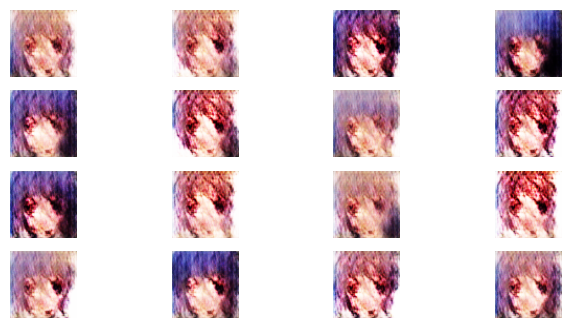

  2%|▎         | 1/40 [00:10<07:08, 10.99s/it]

Time for epoch 1 is 10.990216493606567 sec
Training started with epochs 2 with 211 bateches...
Losses after epoch     2: generator 1.769, discriminator 0.711,  real_score 82.74%, fake_score 31.11%


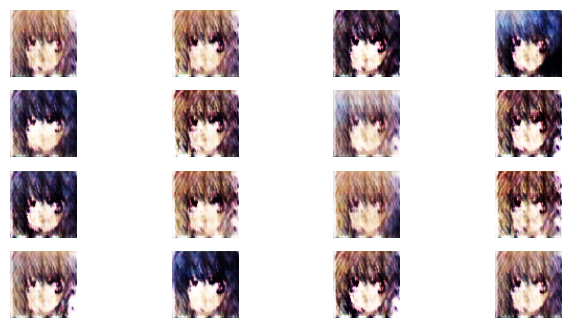

  5%|▌         | 2/40 [00:14<04:19,  6.84s/it]

Time for epoch 2 is 3.930875539779663 sec
Training started with epochs 3 with 211 bateches...
Losses after epoch     3: generator 3.008, discriminator 0.258,  real_score 88.46%, fake_score 11.21%


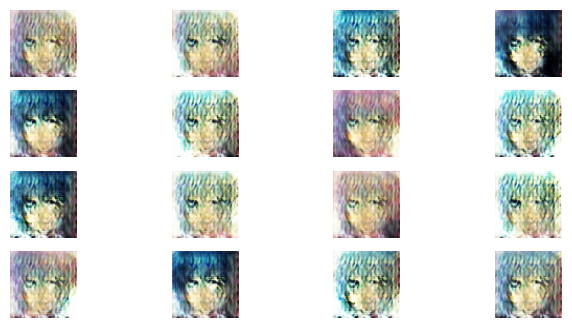

  8%|▊         | 3/40 [00:18<03:12,  5.19s/it]

Time for epoch 3 is 3.2301344871520996 sec
Training started with epochs 4 with 211 bateches...
Losses after epoch     4: generator 4.361, discriminator 0.068,  real_score 98.70%, fake_score 4.81%


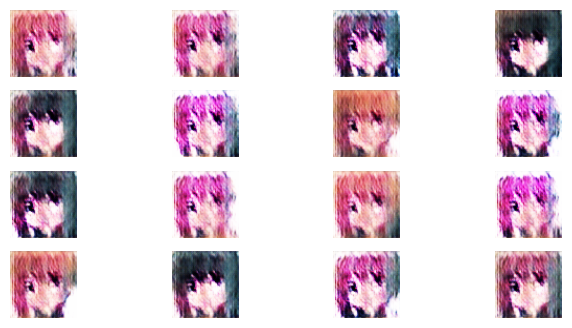

 10%|█         | 4/40 [00:21<02:39,  4.43s/it]

Time for epoch 4 is 3.2540416717529297 sec
Training started with epochs 5 with 211 bateches...
Losses after epoch     5: generator 5.600, discriminator 3.801,  real_score 24.21%, fake_score 1.50%


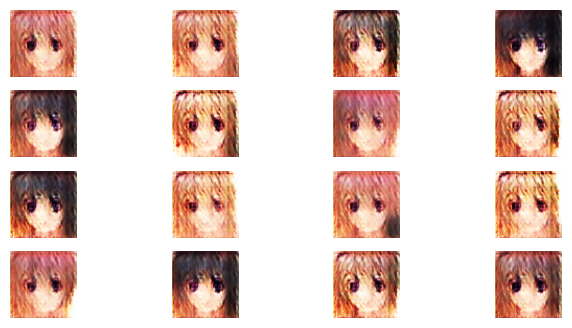

 12%|█▎        | 5/40 [00:25<02:31,  4.33s/it]

Time for epoch 5 is 4.16117525100708 sec
Training started with epochs 6 with 211 bateches...
Losses after epoch     6: generator 3.654, discriminator 0.802,  real_score 64.16%, fake_score 5.34%


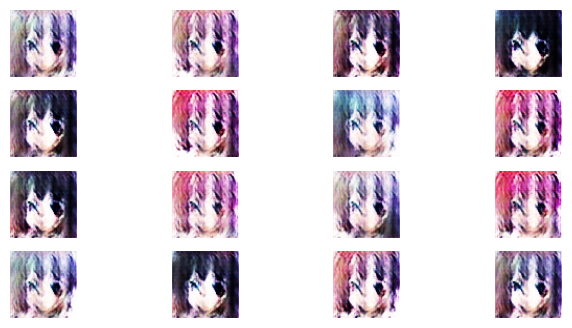

 15%|█▌        | 6/40 [00:29<02:18,  4.06s/it]

Time for epoch 6 is 3.540290117263794 sec
Training started with epochs 7 with 211 bateches...
Losses after epoch     7: generator 2.851, discriminator 0.457,  real_score 82.04%, fake_score 16.33%


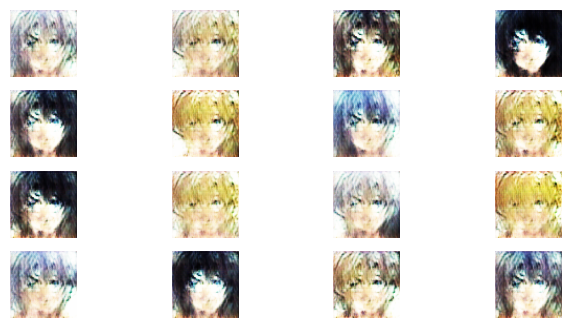

 18%|█▊        | 7/40 [00:32<02:05,  3.79s/it]

Time for epoch 7 is 3.2334482669830322 sec
Training started with epochs 8 with 211 bateches...
Losses after epoch     8: generator 4.396, discriminator 6.417,  real_score 8.55%, fake_score 4.75%


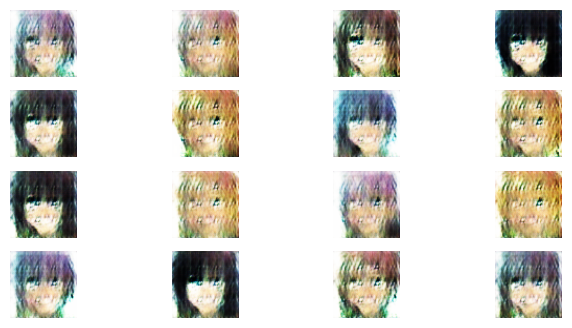

 20%|██        | 8/40 [00:36<02:00,  3.75s/it]

Time for epoch 8 is 3.661799907684326 sec
Training started with epochs 9 with 211 bateches...
Losses after epoch     9: generator 5.190, discriminator 0.810,  real_score 69.99%, fake_score 2.12%


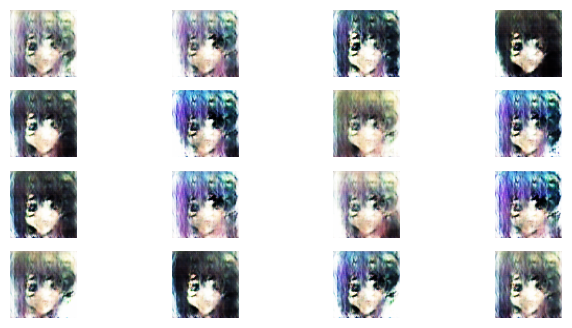

 22%|██▎       | 9/40 [00:39<01:54,  3.71s/it]

Time for epoch 9 is 3.5976011753082275 sec
Training started with epochs 10 with 211 bateches...
Losses after epoch    10: generator 3.997, discriminator 0.086,  real_score 99.38%, fake_score 6.30%


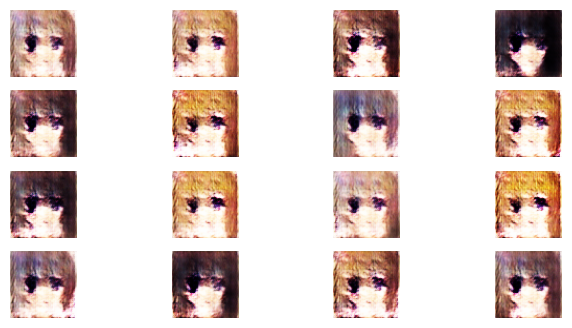

 25%|██▌       | 10/40 [00:45<02:11,  4.38s/it]

Time for epoch 10 is 5.882277250289917 sec
Training started with epochs 11 with 211 bateches...
Losses after epoch    11: generator 5.807, discriminator 1.104,  real_score 52.64%, fake_score 1.82%


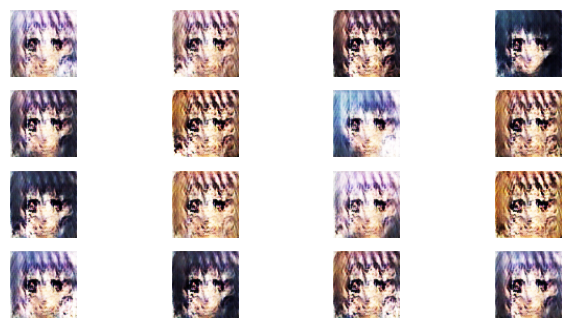

 28%|██▊       | 11/40 [00:49<02:07,  4.38s/it]

Time for epoch 11 is 4.379229784011841 sec
Training started with epochs 12 with 211 bateches...
Losses after epoch    12: generator 3.620, discriminator 1.167,  real_score 55.32%, fake_score 6.26%


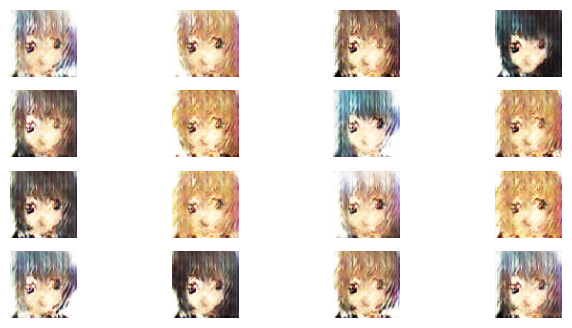

 30%|███       | 12/40 [00:53<01:53,  4.04s/it]

Time for epoch 12 is 3.2760977745056152 sec
Training started with epochs 13 with 211 bateches...
Losses after epoch    13: generator 1.906, discriminator 0.470,  real_score 99.73%, fake_score 28.44%


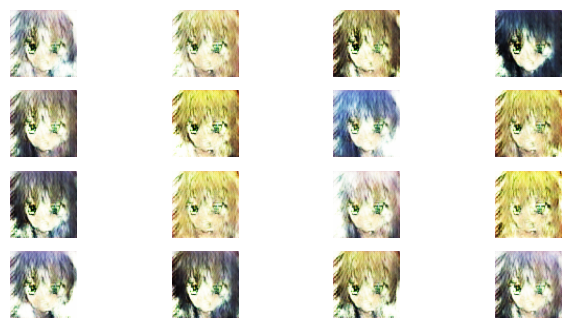

 32%|███▎      | 13/40 [00:56<01:43,  3.84s/it]

Time for epoch 13 is 3.3582828044891357 sec
Training started with epochs 14 with 211 bateches...
Losses after epoch    14: generator 3.086, discriminator 0.229,  real_score 93.70%, fake_score 12.33%


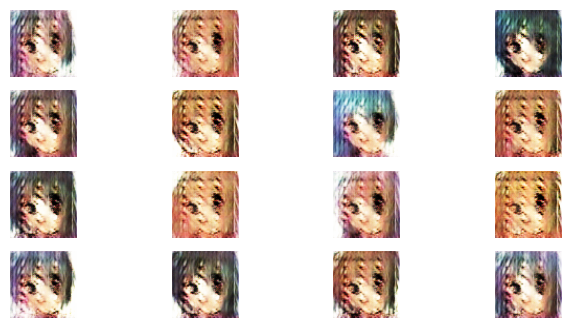

 35%|███▌      | 14/40 [01:00<01:38,  3.79s/it]

Time for epoch 14 is 3.6762142181396484 sec
Training started with epochs 15 with 211 bateches...
Losses after epoch    15: generator 3.230, discriminator 0.741,  real_score 69.64%, fake_score 10.93%


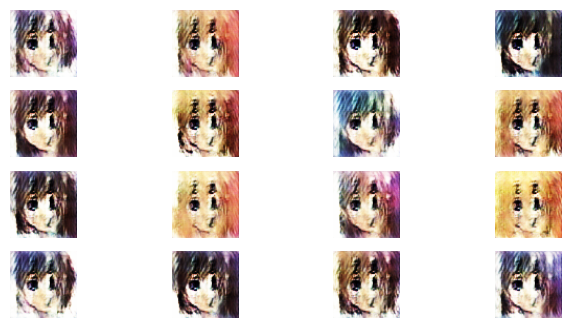

 38%|███▊      | 15/40 [01:03<01:33,  3.72s/it]

Time for epoch 15 is 3.561795234680176 sec
Training started with epochs 16 with 211 bateches...
Losses after epoch    16: generator 5.505, discriminator 0.060,  real_score 96.42%, fake_score 2.05%


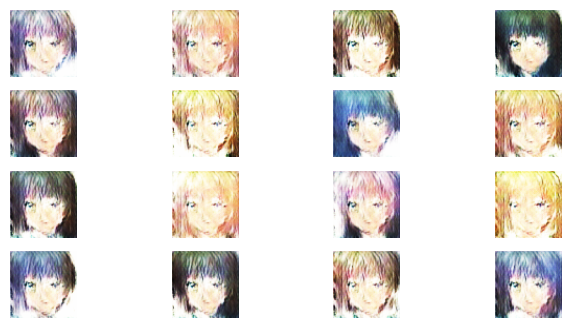

 40%|████      | 16/40 [01:07<01:28,  3.69s/it]

Time for epoch 16 is 3.6172618865966797 sec
Training started with epochs 17 with 211 bateches...
Losses after epoch    17: generator 2.768, discriminator 0.264,  real_score 94.29%, fake_score 14.17%


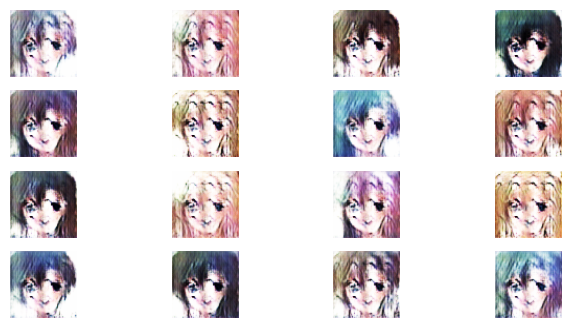

 42%|████▎     | 17/40 [01:10<01:22,  3.59s/it]

Time for epoch 17 is 3.344430923461914 sec
Training started with epochs 18 with 211 bateches...
Losses after epoch    18: generator 5.599, discriminator 0.052,  real_score 96.28%, fake_score 1.24%


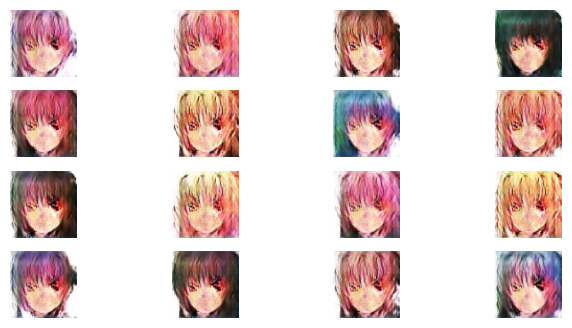

 45%|████▌     | 18/40 [01:14<01:22,  3.73s/it]

Time for epoch 18 is 4.054450511932373 sec
Training started with epochs 19 with 211 bateches...
Losses after epoch    19: generator 2.814, discriminator 0.756,  real_score 61.36%, fake_score 11.23%


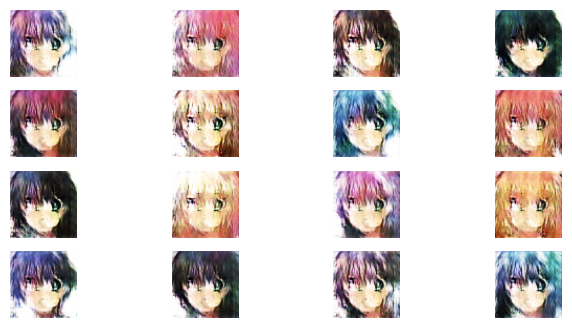

 48%|████▊     | 19/40 [01:18<01:16,  3.62s/it]

Time for epoch 19 is 3.3703553676605225 sec
Training started with epochs 20 with 211 bateches...
Losses after epoch    20: generator 3.097, discriminator 0.252,  real_score 93.94%, fake_score 13.76%


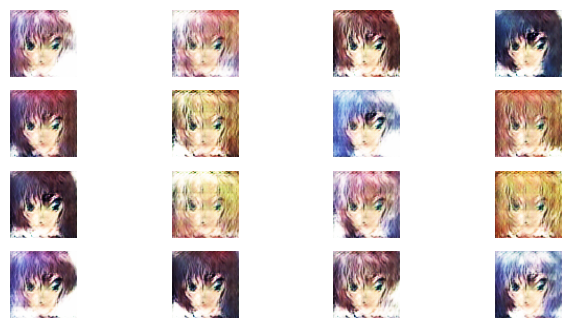

 50%|█████     | 20/40 [01:21<01:12,  3.60s/it]

Time for epoch 20 is 3.543498992919922 sec
Training started with epochs 21 with 211 bateches...
Losses after epoch    21: generator 3.947, discriminator 0.143,  real_score 96.60%, fake_score 7.70%


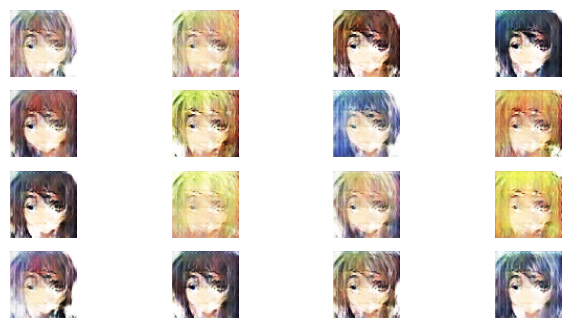

 52%|█████▎    | 21/40 [01:26<01:12,  3.84s/it]

Time for epoch 21 is 4.385635614395142 sec
Training started with epochs 22 with 211 bateches...
Losses after epoch    22: generator 4.895, discriminator 0.883,  real_score 58.21%, fake_score 1.93%


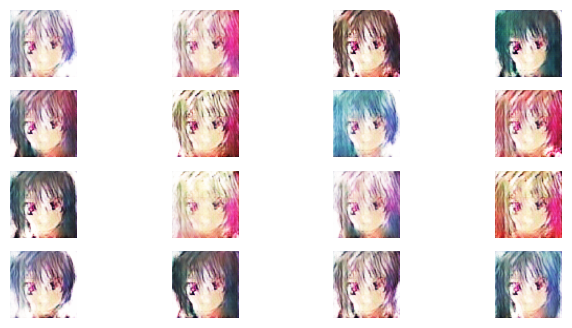

 55%|█████▌    | 22/40 [01:29<01:06,  3.70s/it]

Time for epoch 22 is 3.376523494720459 sec
Training started with epochs 23 with 211 bateches...
Losses after epoch    23: generator 3.465, discriminator 1.028,  real_score 67.02%, fake_score 10.21%


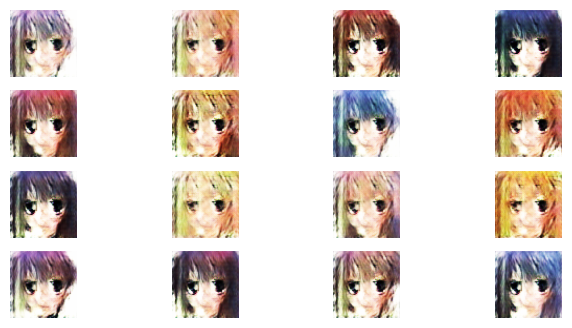

 57%|█████▊    | 23/40 [01:32<01:01,  3.60s/it]

Time for epoch 23 is 3.3582839965820312 sec
Training started with epochs 24 with 211 bateches...
Losses after epoch    24: generator 3.146, discriminator 0.724,  real_score 72.48%, fake_score 7.35%


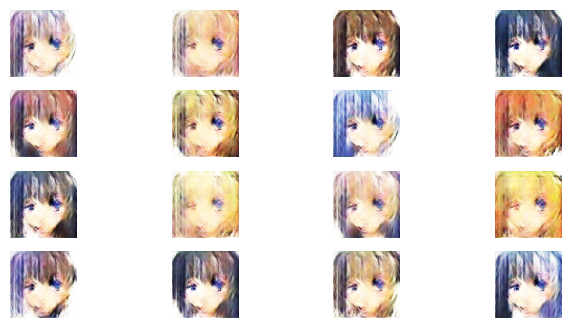

 60%|██████    | 24/40 [01:36<00:59,  3.74s/it]

Time for epoch 24 is 4.073947906494141 sec
Training started with epochs 25 with 211 bateches...
Losses after epoch    25: generator 3.302, discriminator 0.212,  real_score 93.18%, fake_score 10.68%


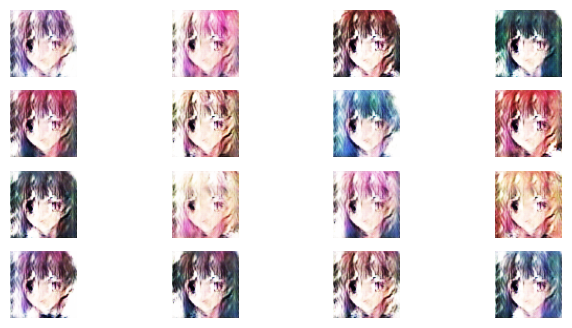

 62%|██████▎   | 25/40 [01:40<00:54,  3.63s/it]

Time for epoch 25 is 3.368525505065918 sec
Training started with epochs 26 with 211 bateches...
Losses after epoch    26: generator 3.269, discriminator 0.252,  real_score 90.60%, fake_score 11.89%


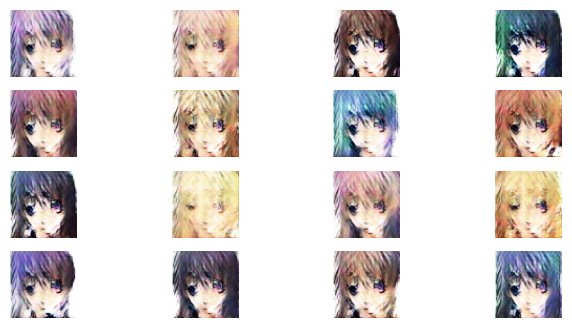

 65%|██████▌   | 26/40 [01:44<00:51,  3.66s/it]

Time for epoch 26 is 3.7130963802337646 sec
Training started with epochs 27 with 211 bateches...
Losses after epoch    27: generator 6.804, discriminator 0.207,  real_score 82.44%, fake_score 0.32%


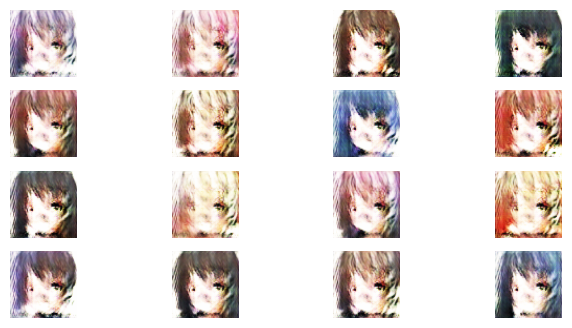

 68%|██████▊   | 27/40 [01:47<00:47,  3.65s/it]

Time for epoch 27 is 3.638869047164917 sec
Training started with epochs 28 with 211 bateches...
Losses after epoch    28: generator 3.720, discriminator 0.701,  real_score 69.91%, fake_score 9.17%


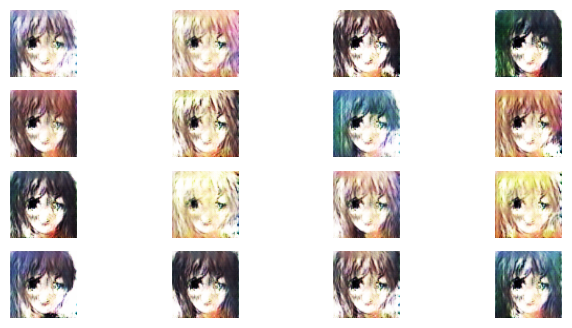

 70%|███████   | 28/40 [01:51<00:44,  3.72s/it]

Time for epoch 28 is 3.873239278793335 sec
Training started with epochs 29 with 211 bateches...
Losses after epoch    29: generator 3.003, discriminator 0.426,  real_score 81.76%, fake_score 13.99%


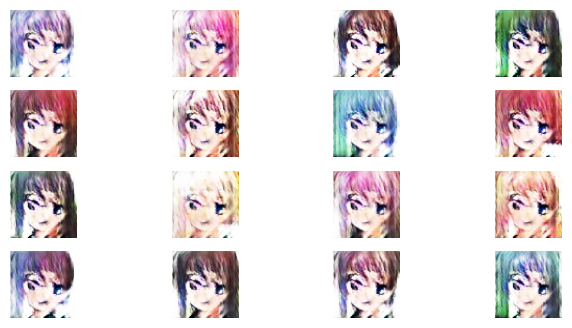

 72%|███████▎  | 29/40 [01:54<00:39,  3.62s/it]

Time for epoch 29 is 3.368586778640747 sec
Training started with epochs 30 with 211 bateches...
Losses after epoch    30: generator 3.399, discriminator 0.211,  real_score 97.30%, fake_score 11.87%


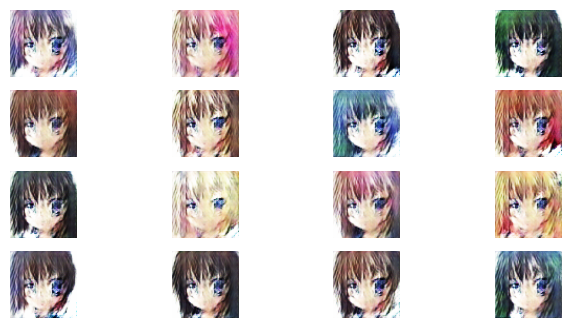

 75%|███████▌  | 30/40 [01:58<00:36,  3.64s/it]

Time for epoch 30 is 3.6780099868774414 sec
Training started with epochs 31 with 211 bateches...
Losses after epoch    31: generator 6.229, discriminator 0.592,  real_score 69.77%, fake_score 0.55%


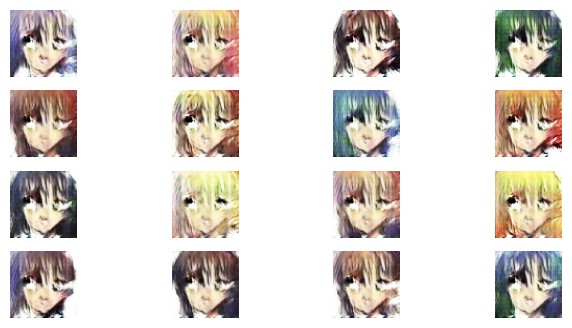

 78%|███████▊  | 31/40 [02:03<00:34,  3.86s/it]

Time for epoch 31 is 4.3691322803497314 sec
Training started with epochs 32 with 211 bateches...
Losses after epoch    32: generator 4.549, discriminator 0.070,  real_score 99.21%, fake_score 5.04%


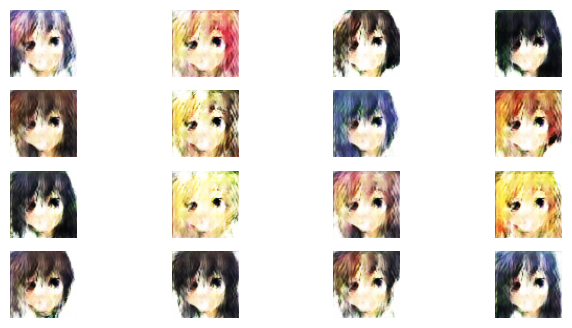

 80%|████████  | 32/40 [02:06<00:29,  3.73s/it]

Time for epoch 32 is 3.4348161220550537 sec
Training started with epochs 33 with 211 bateches...
Losses after epoch    33: generator 5.128, discriminator 0.068,  real_score 99.26%, fake_score 4.20%


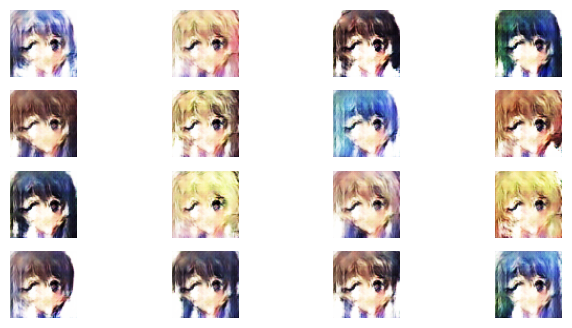

 82%|████████▎ | 33/40 [02:09<00:25,  3.65s/it]

Time for epoch 33 is 3.4666426181793213 sec
Training started with epochs 34 with 211 bateches...
Losses after epoch    34: generator 4.108, discriminator 0.210,  real_score 91.96%, fake_score 8.88%


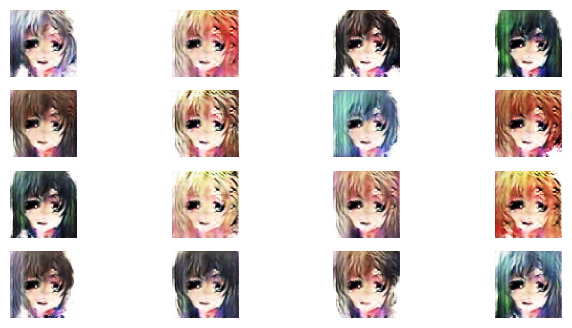

 85%|████████▌ | 34/40 [02:14<00:22,  3.79s/it]

Time for epoch 34 is 4.123993396759033 sec
Training started with epochs 35 with 211 bateches...
Losses after epoch    35: generator 2.629, discriminator 0.593,  real_score 81.37%, fake_score 20.99%


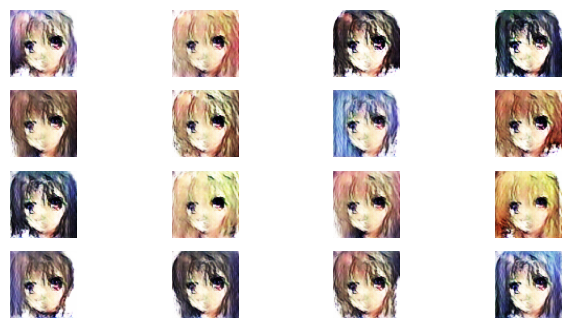

 88%|████████▊ | 35/40 [02:17<00:18,  3.69s/it]

Time for epoch 35 is 3.444523572921753 sec
Training started with epochs 36 with 211 bateches...
Losses after epoch    36: generator 2.200, discriminator 0.443,  real_score 97.42%, fake_score 25.62%


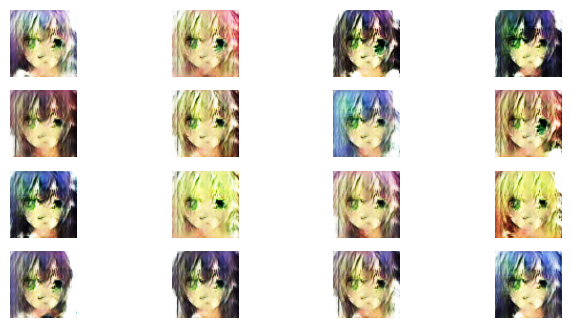

 90%|█████████ | 36/40 [02:22<00:15,  3.95s/it]

Time for epoch 36 is 4.552568435668945 sec
Training started with epochs 37 with 211 bateches...
Losses after epoch    37: generator 4.248, discriminator 0.197,  real_score 89.08%, fake_score 5.93%


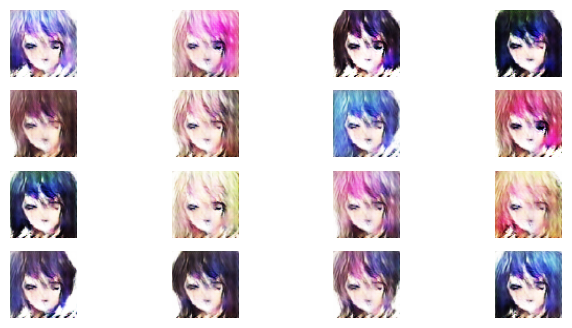

 92%|█████████▎| 37/40 [02:27<00:13,  4.46s/it]

Time for epoch 37 is 5.658448696136475 sec
Training started with epochs 38 with 211 bateches...
Losses after epoch    38: generator 3.777, discriminator 0.672,  real_score 78.08%, fake_score 12.05%


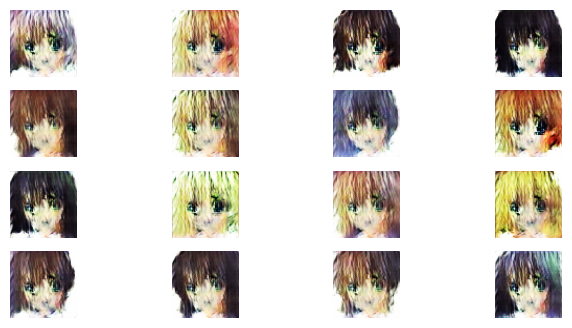

 95%|█████████▌| 38/40 [02:31<00:08,  4.16s/it]

Time for epoch 38 is 3.4525339603424072 sec
Training started with epochs 39 with 211 bateches...
Losses after epoch    39: generator 2.690, discriminator 0.280,  real_score 97.28%, fake_score 17.26%


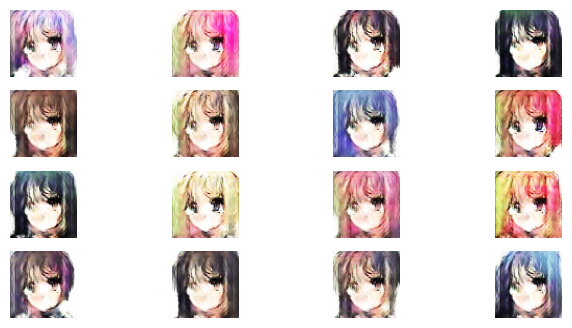

 98%|█████████▊| 39/40 [02:34<00:03,  3.96s/it]

Time for epoch 39 is 3.47304630279541 sec
Training started with epochs 40 with 211 bateches...
Losses after epoch    40: generator 5.483, discriminator 0.485,  real_score 65.76%, fake_score 2.47%


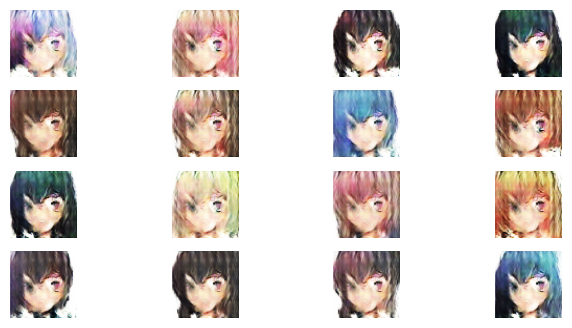

100%|██████████| 40/40 [02:39<00:00,  3.98s/it]

Time for epoch 40 is 4.451995134353638 sec


In [38]:
# start training process
gen_loss_epochs, disc_loss_epochs, real_score_list, fake_score_list=train(train_dataset,epochs=epochs)

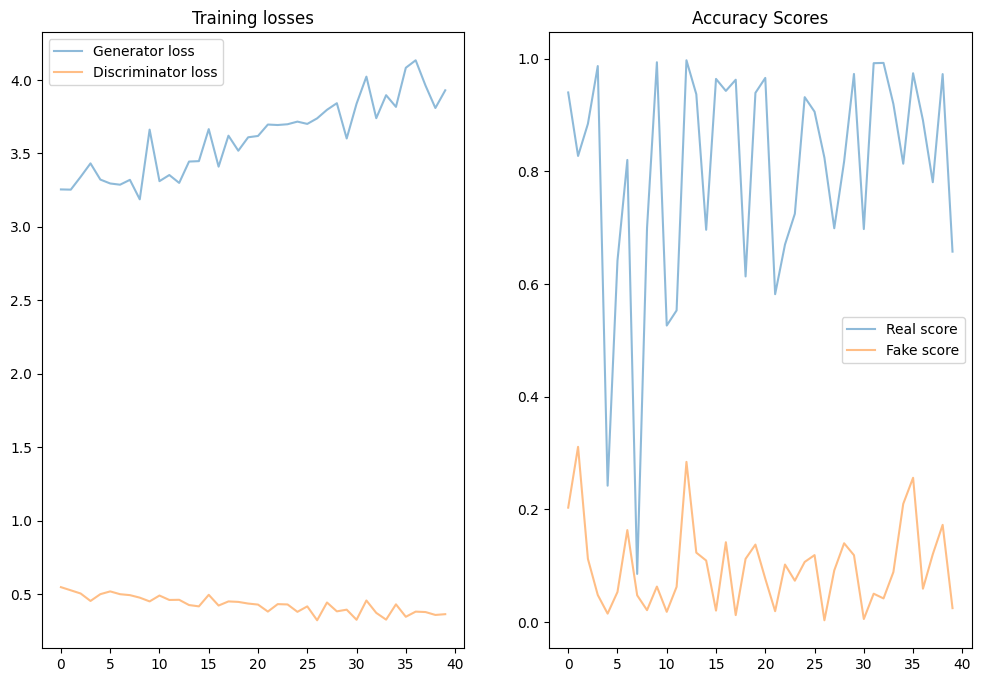

In [39]:
# generated images from the generator improves over time
# discriminator performance becomes worse over time (its loss increases over time)
fig, (ax1,ax2)=plt.subplots(1,2,figsize=(12,8))

ax1.plot(gen_loss_epochs, label='Generator loss', alpha=0.5)
ax1.plot(disc_loss_epochs, label='Discriminator loss', alpha=0.5)
ax1.set_title('Training losses')
ax1.legend()

ax2.plot(real_score_list, label='Real score',alpha=0.5)
ax2.plot(fake_score_list, label='Fake score',alpha=0.5)
ax2.set_title('Accuracy Scores')
ax2.legend()